In [2]:
import os
import cv2
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

import keras
import tensorflow as tf

from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout, BatchNormalization, Activation

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, recall_score, precision_score, f1_score 

# Define Data Path


In [3]:
train_path = r'./Data/train'
test_path = r'./Data/test'
val_path = r'./Data/val'

# Define Categories

In [4]:
CATEGORIES = ['ArtDecor', 'Hitech', 'Indochina', 'Industrial', 'Scandinavian']

# Define Image Input Size

In [5]:
IMG_SIZE = 224

# Load Data From Directory


In [6]:
batch_size_train = 100
batch_size_val = 100

In [7]:
training_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# validation_datagen = ImageDataGenerator(rescale = 1./255)
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = training_datagen.flow_from_directory(
    train_path,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode='categorical',
    batch_size=batch_size_train
)

validation_generator = validation_datagen.flow_from_directory(
    val_path,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode='categorical',
    batch_size=batch_size_val
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode='categorical',
    batch_size=batch_size_val
)

Found 11432 images belonging to 5 classes.
Found 2023 images belonging to 5 classes.
Found 2500 images belonging to 5 classes.


# VGG19 Model

In [8]:
vgg = VGG19(input_shape = (224, 224, 3), weights = 'imagenet', include_top = False)

In [9]:
for layer in vgg.layers:
    layer.trainable = False

x = Flatten()(vgg.output)
prediction = Dense(5, activation='softmax')(x)

model = Model(inputs=vgg.input, outputs=prediction)
model.summary()
model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

# history = model.fit(x_train, y_train, validation_data = (x_val, y_val), epochs = 20, steps_per_epoch = 20, batch_size = 1, shuffle=True)

history = model.fit(train_generator, validation_data = validation_generator, epochs = 20, steps_per_epoch = 20, shuffle=True)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

# Load Model From h5 File

In [10]:
# model = tf.keras.models.load_model('vgg19_model.h5')

# Visualization

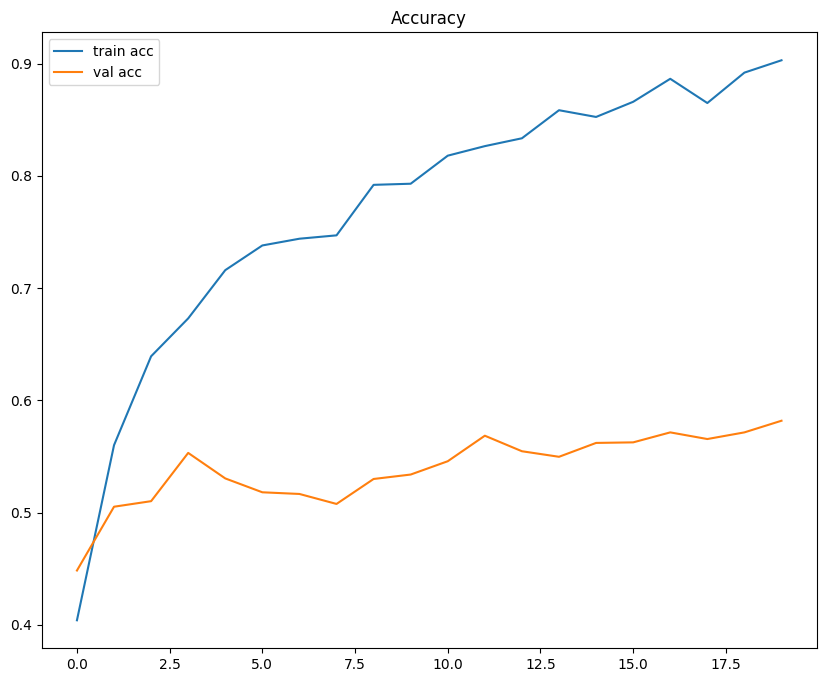

In [11]:
plt.figure(figsize=(10, 8))
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.legend()
plt.title('Accuracy')
plt.show()

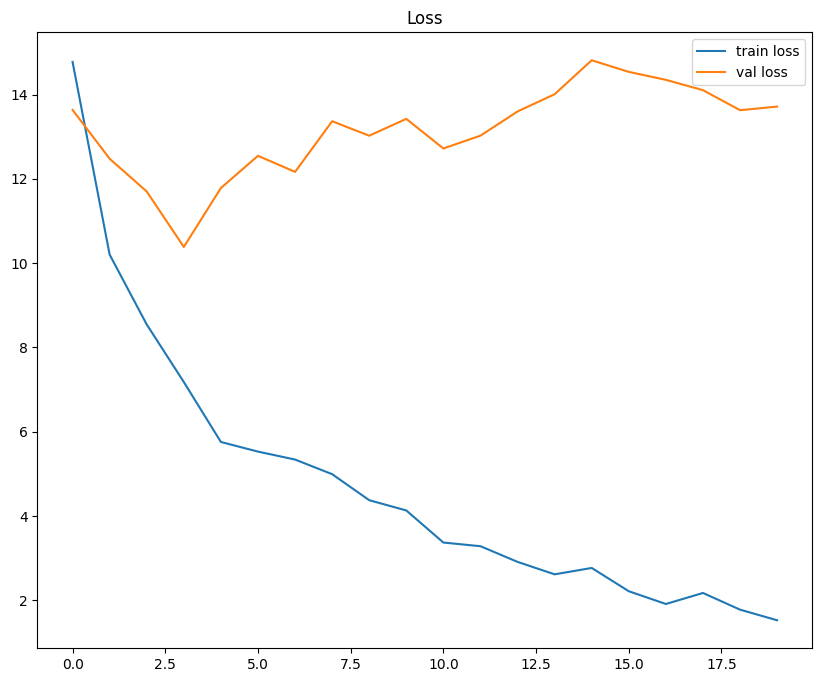

In [12]:
plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.title('Loss')
plt.show()

# Confusion Matrix

In [18]:
y_pred = model.predict(validation_generator)
y_pred = np.argmax(y_pred,axis=1)

21/21 [==============================] - 7s 331ms/step


In [19]:
len(y_pred)

2023

In [20]:
validation_generator.labels

array([0, 0, 0, ..., 4, 4, 4])

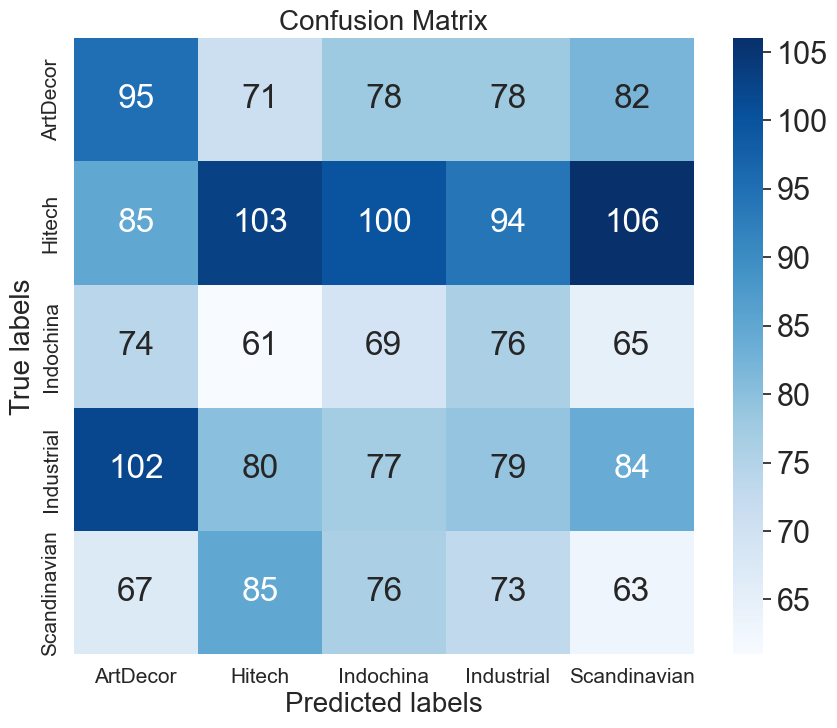

In [21]:
cm = confusion_matrix(y_pred,validation_generator.labels)

plt.figure(figsize=(10, 8))
ax = plt.subplot()
sns.set(font_scale=2.0)
sns.heatmap(cm, annot=True, fmt='g', cmap="Blues", ax=ax); 

# labels, title and ticks
ax.set_xlabel('Predicted labels', fontsize=20);ax.set_ylabel('True labels', fontsize=20); 
ax.set_title('Confusion Matrix', fontsize=20); 
ax.xaxis.set_ticklabels(['ArtDecor', 'Hitech', 'Indochina', 'Industrial', 'Scandinavian'], fontsize=15); ax.yaxis.set_ticklabels(['ArtDecor', 'Hitech', 'Indochina', 'Industrial', 'Scandinavian'], fontsize=15);

# Alternative Confusion Matrix

In [46]:
DATADIR = "./Data/test"
CATEGORIES = ["ArtDecor", "Hitech", "Indochina", "Industrial", "Scandinavian"]

predict_data = []

def create_predict_data():
    for category in CATEGORIES:  
        temp_predict_data = []
        path = os.path.join(DATADIR,category)  # create path 
        class_num = CATEGORIES.index(category)
        for img in tqdm(os.listdir(path)):  # iterate over each image 
            try:
                img_array = cv2.imread(os.path.join(path,img))  # convert to array
                img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)
                new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
                temp_predict_data.append(new_array)
#                 predict_data.append([new_array, class_num])
            except Exception as e:  # in the interest in keeping the output clean...
                pass
#             except OSError as e:
#                print("OSErrroBad img most likely", e, os.path.join(path,img))
#             except Exception as e:
#                print("general exception", e, os.path.join(path,img))
        predict_data.append(temp_predict_data)

create_predict_data()

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1341.37it/s]


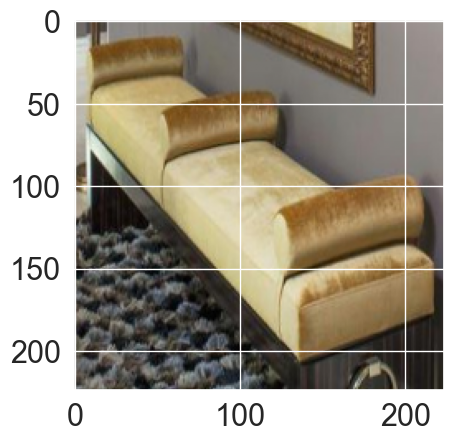

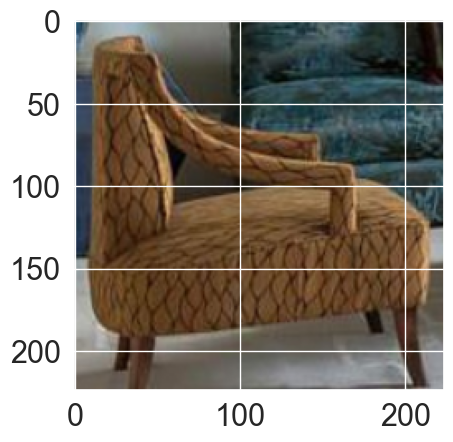

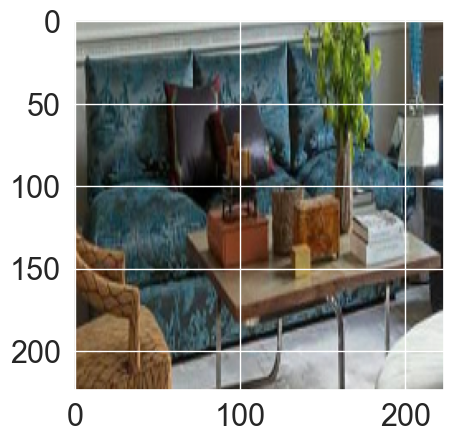

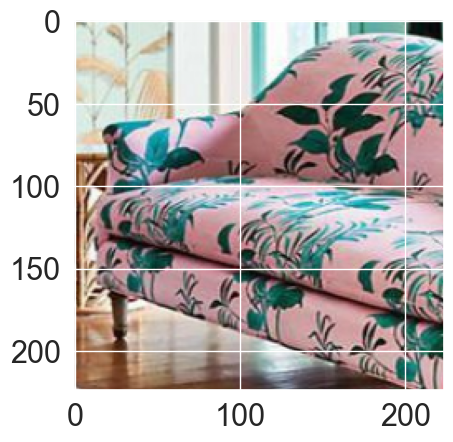

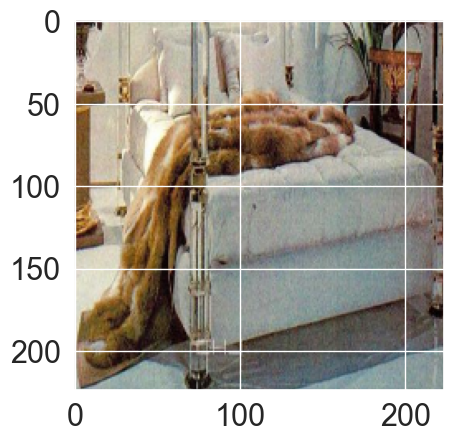

...

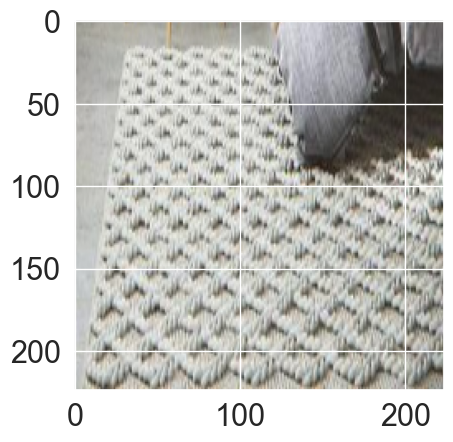

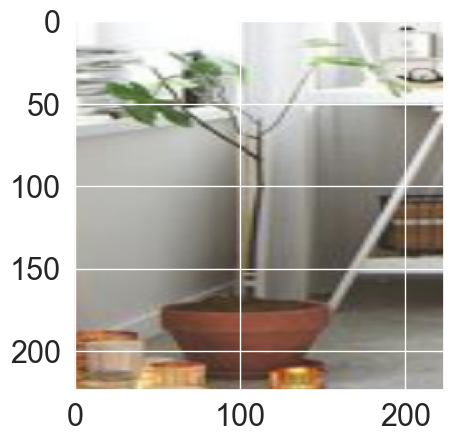

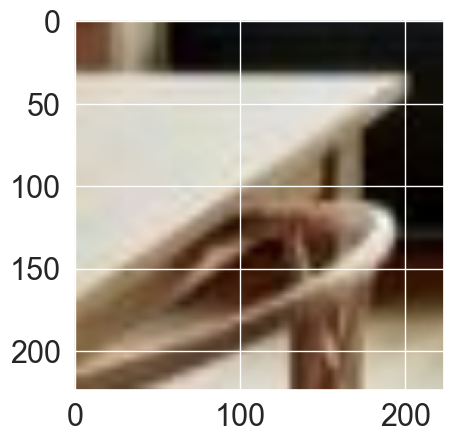

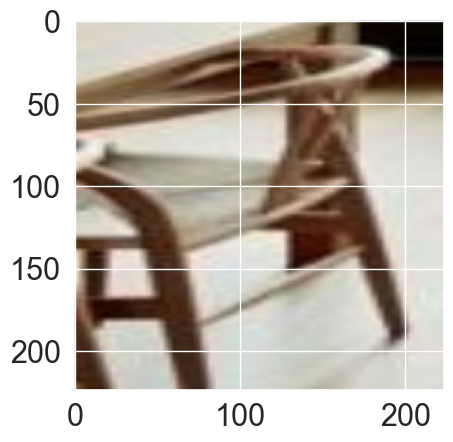

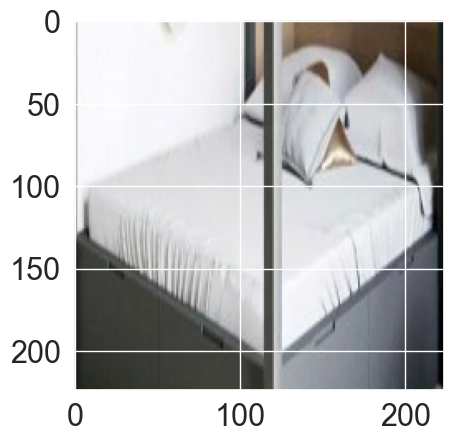

In [47]:
for style in predict_data:
    for img in style[:10]:
        plt.imshow(img)
        plt.show()

In [49]:
# model = tf.keras.models.load_model('vgg19_model_2.h5')

confusion_matrix = []

for style in predict_data:
    
    no_artdecor = 0
    no_hitech = 0
    no_indochina = 0
    no_industrial = 0
    no_scandinavian = 0
    
    for img in style[:10]:
        x = img/255.0
        x = np.expand_dims(x, axis=0)
        classes = model.predict(x)
        
        max_prob = np.amax(classes[0])
        max_prob_index = np.argmax(classes[0])
        print(classes[0])
        print(max_prob_index)
        if(max_prob_index == 0):
            no_artdecor += 1
        elif(max_prob_index == 1):
            no_hitech += 1
        elif(max_prob_index == 2):
            no_indochina += 1
        elif(max_prob_index == 3):
            no_industrial += 1
        elif(max_prob_index == 4):
            no_scandinavian += 1
    
    confusion_matrix.append([no_artdecor, no_hitech, no_indochina, no_industrial, no_scandinavian])

1/1 [==============================] - 0s 15ms/step
[4.8379803e-07 9.9994385e-01 4.0954685e-05 1.0731826e-05 3.9650317e-06]
1
1/1 [==============================] - 0s 16ms/step
[4.82235691e-07 9.99944091e-01 4.08054148e-05 1.06908765e-05
 3.95322195e-06]
1
1/1 [==============================] - 0s 16ms/step
[4.8486743e-07 9.9994397e-01 4.0876879e-05 1.0724267e-05 3.9480828e-06]
1
1/1 [==============================] - 0s 13ms/step
[4.8817611e-07 9.9994397e-01 4.0993025e-05 1.0610459e-05 3.9186848e-06]
1
1/1 [==============================] - 0s 14ms/step
[4.8448015e-07 9.9994421e-01 4.0719820e-05 1.0653261e-05 3.9436845e-06]
1
1/1 [==============================] - 0s 14ms/step
[4.8679283e-07 9.9994361e-01 4.1192638e-05 1.0720100e-05 3.9855863e-06]
1
1/1 [==============================] - 0s 14ms/step
[4.8402887e-07 9.9994397e-01 4.0897939e-05 1.0677251e-05 3.9701290e-06]
1
1/1 [==============================] - 0s 14ms/step
[4.8307459e-07 9.9994361e-01 4.1311130e-05 1.0639719e-05 3.9

In [28]:
print(confusion_matrix)

[[0, 500, 0, 0, 0], [0, 500, 0, 0, 0], [0, 500, 0, 0, 0], [0, 500, 0, 0, 0], [0, 500, 0, 0, 0]]


# Saving Model

In [38]:
model.save("vgg19_model_2.h5")